In [ ]:
import os
import random
from glob import glob
from warnings import simplefilter

import pandas as pd
import albumentations as A
from IPython.display import Image, display

In [2]:
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=UserWarning)

#### Configure path parameters and read data files

In [3]:
MIDS_USER = os.getenv("MIDS_USER", None)  # this can be replaced, with e.g. `m25...`

if MIDS_USER is None:
  ROOT_DIR = os.path.abspath(os.path.join(os.getcwd(), *['..'] * 1)) 
else:
  ROOT_DIR = f"/home/mids/{MIDS_USER}/Capstone"

IMAGES_DIR = os.path.join(ROOT_DIR, "data", "datasets", "aircraft", "images")
if not os.path.exists(IMAGES_DIR):
  ROOT_DIR = os.path.join(ROOT_DIR, "lc-14")
  IMAGES_DIR = os.path.join(ROOT_DIR, "data", "datasets", "aircraft", "images")

RADOM_SEED = 2020

In [6]:
images = glob(os.path.join(IMAGES_DIR, "*.jpg"))  # get all files with the .jpg extension
labels_fp = os.path.join(ROOT_DIR, "data", "datasets", "aircraft", "annotations.csv")

In [7]:
df_labels = pd.read_csv(labels_fp, converters={'geometry':lambda x:list(eval(x))})  # parse the list of tuples from string literal

#### Load utility functions

In [8]:
os.chdir(ROOT_DIR)

In [12]:
%pip install opencv-python


     ━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━ 49.0/95.2 MB 489.7 kB/s eta 0:01:35
ERROR: THESE PACKAGES DO NOT MATCH THE HASHES FROM THE REQUIREMENTS FILE. If you have updated the package versions, please update the hashes. Otherwise, examine the package contents carefully; someone may have tampered with them.
    opencv-python from https://files.pythonhosted.org/packages/17/06/68c27a523103dad5837dc5b87e71285280c4f098c60e4fe8a8db6486ab09/opencv-python-4.11.0.86.tar.gz:
        Expected sha256 03d60ccae62304860d232272e4a4fda93c39d595780cb40b161b310244b736a4
             Got        7a42fd7fd4ec3089efdd82fb4ca7d2bb071d15c90c14c0acf3c462d962c82989

Note: you may need to restart the kernel to use updated packages.


In [ ]:
from src.utilities.plotting.visualize_transformation import visualize_transformations

ModuleNotFoundError: No module named 'cv2'

#### Sample an image from the dataset

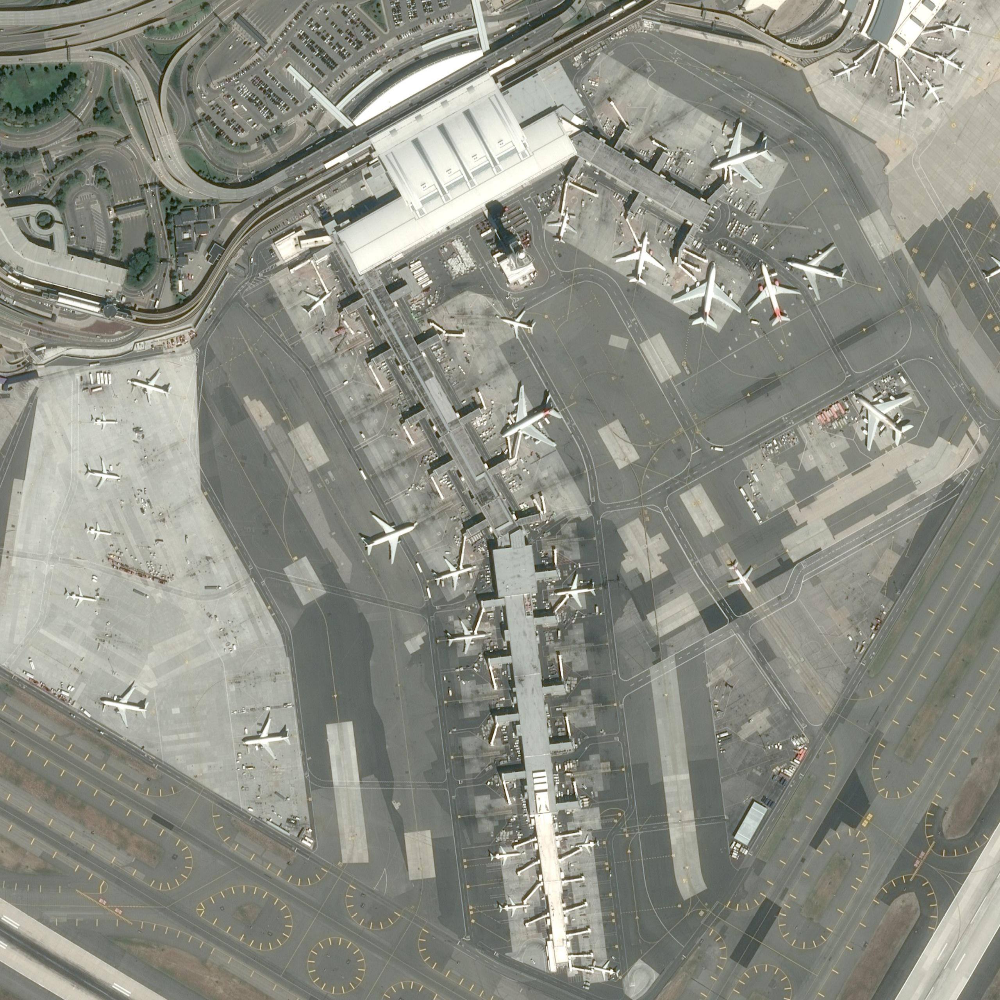

In [ ]:
sampled_image_fp = random.choice(images)
display(Image(sampled_image_fp))

### Visualize an Albumations Transformations pipeline

We can define an example transformations pipeline, visualizing the selected image at each step of the pipeline.

In [ ]:
transformations = A.Compose([
  A.Resize(256, 256),  # This transform resizes each image before subsequent processing
  A.HorizontalFlip(0.5)
  A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # This transformation normalizes from standard RGB to grayscale

])


Rather than learning these feature maps directly, we can examined the feature maps from a pre-trained model, which leverages CNN modules to learn features relevant to object detection.

In [29]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from PIL import Image as PILImage

For demonstration, we can select the "[Faster R-CNN with ResNet-50 Backbone and Feature Pyramid Network (FPN)](https://arxiv.org/pdf/1506.01497)" model from the `torchvision` package.

Faster R-CNN builds upon the foundations of Convolutional Neural Networks (CNNs) for object detection, combining the strengths of region proposal networks and deep feature extraction. At its heart lies a backbone CNN, such as ResNet-50, responsible for generating a hierarchy of feature maps that capture progressively more abstract visual information from an input image. These feature maps serve as the foundation for subsequent object detection stages. The Region Proposal Network (RPN) leverages these feature maps to propose potential regions of interest (bounding boxes) that are likely to contain objects. These proposals are then refined and classified by the Region of Interest (RoI) pooling layer, which extracts fixed-size feature vectors from the proposed regions. Finally, a classifier head predicts the object categories and refines the bounding box coordinates for each proposal, enabling accurate object detection and localization.

#### Technical Implementation:

The Faster R-CNN architecture with a ResNet-50 backbone and Feature Pyramid Network (FPN) employs several key components. The ResNet-50 backbone acts as a powerful feature extractor, efficiently processing the input image through a series of convolutional layers with residual connections. The FPN enhances the feature maps by creating a pyramid of feature maps at multiple scales, allowing the model to detect objects of various sizes. The RPN slides over these feature maps, generating anchor boxes at different scales and aspect ratios and predicting objectness scores and bounding box offsets for each anchor. The RoI pooling layer then extracts features from the proposed regions, ensuring a fixed-size representation for the subsequent classifier head. Finally, the classifier head, typically consisting of fully connected layers, predicts the object class and refines the bounding box coordinates, providing the final object detections.

#### Feature Extraction for Region Proposals

In the Faster R-CNN framework, the region proposal mechanism is tightly integrated with the feature extraction process. The RPN directly leverages the multi-scale feature maps generated by the FPN, allowing it to effectively identify potential object locations across a wide range of scales. The high-level feature maps from the deeper layers of the ResNet-50 backbone capture rich semantic information, enabling the RPN to discriminate between object-like regions and background. This synergy between feature extraction and region proposal generation leads to a significant improvement in object detection accuracy and efficiency, making Faster R-CNN a cornerstone of modern object detection systems.

#### The Pre-trained Model

In addition to the model architecture, we load the weights and biases for the RCNN ResNet FPN model trained on [the COCO dataset](https://cocodataset.org/#home). The Faster R-CNN model we're using, while powerful, has been pre-trained on the COCO dataset, which focuses on everyday objects rather than specialized domains like aircraft recognition at airports. The model's ability to pinpoint aircraft in our context is limited. As a result, the predictions and feature maps we explore are notional, but interesting to examine none the less. Visualizing the activations of the model's feature maps offers a glimpse into the hierarchical representations it has learned using other data.


In [30]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()  # Set the model to evaluation mode

/opt/conda/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /home/jovyan/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [01:37<00:00, 1.72MB/s] 


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In order to use this pre-trained model in inference (generating proposed bounding boxes for a given, unlabled input image), we must first transform the image to a `torch.Tensor` with the appropriate characteristics.

In [31]:
img = PILImage.open(sampled_image_fp).convert("RGB")

# Define transformations
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to PyTorch tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize to ImageNet stats
])

# Apply transformations to the image
img_tensor = transform(img)
img_tensor = img_tensor.unsqueeze(0)

Now that we have the appropriate tensor representation of our image, we can use the pre-trained model to generate the predicted bounding boxes. As the input image passes through the convolutional layers of the backbone, it undergoes a series of transformations, resulting in a hierarchy of feature maps. These feature maps represent the learned features at different levels of abstraction, from low-level edges and textures in the early layers to more complex object parts and semantic information in the deeper layers. By obtaining these feature maps, we gain insights into the internal representations that the model has learned to identify and utilize for object detection.

In [32]:
# Get the model's predictions
with torch.no_grad():
    predictions = model(img_tensor)

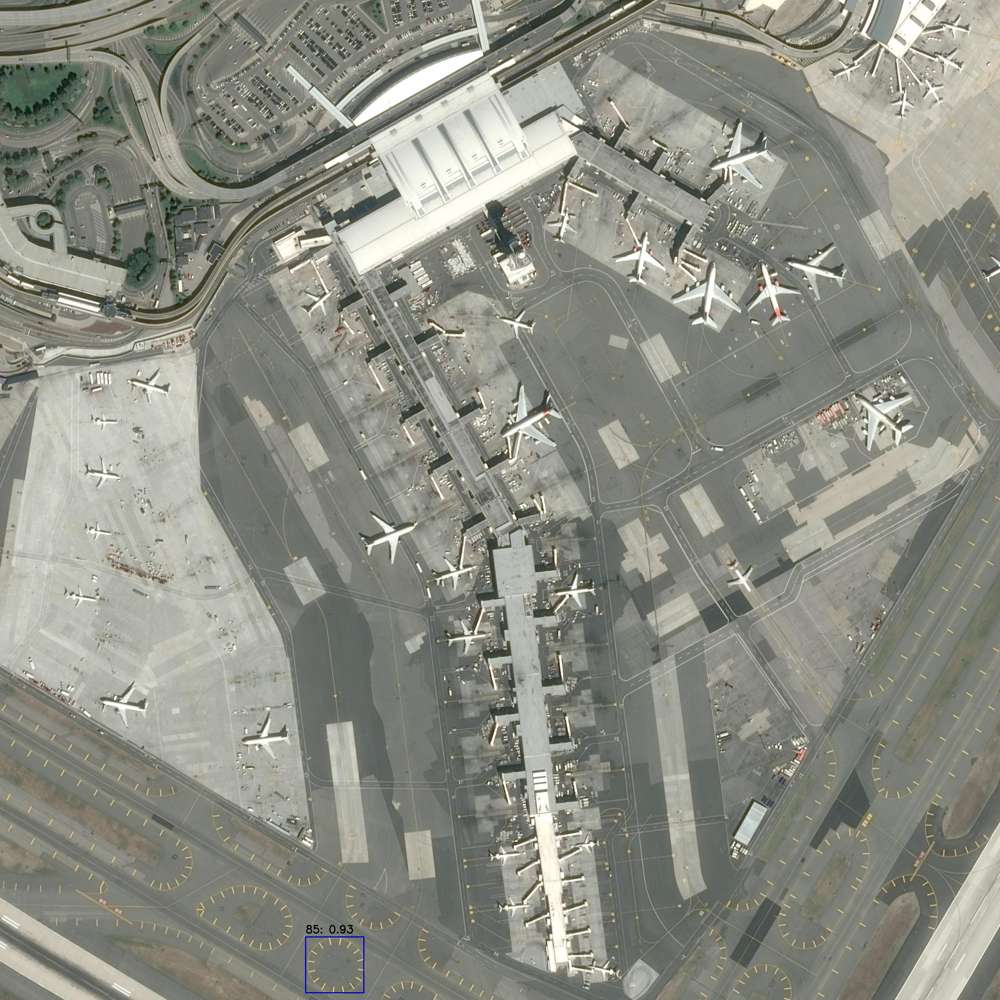

In [33]:
draw_bounding_boxes(sampled_image_fp, prediction=predictions[0])  # we generate batched predictions, so we take the first element

As expected, the model with COCO pre-trained weights failed to identify the aircraft from above in our sampled airport image. Interestingly, we have a bounding box with a high objectness score of class `85`. We can determine what object the model identified in the image by examining the metadata from the `torchvision` package.

In [34]:
model_categories = torchvision.models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT.meta["categories"]
model_categories[85]

'clock'

It does look like a clock! In this case, the feature representation of this patch in our image are similar to those of the clocks in the model's training data.

In [35]:
# Obtain the feature maps
features = model.backbone(img_tensor)

#### Learned Feature Map Visualization

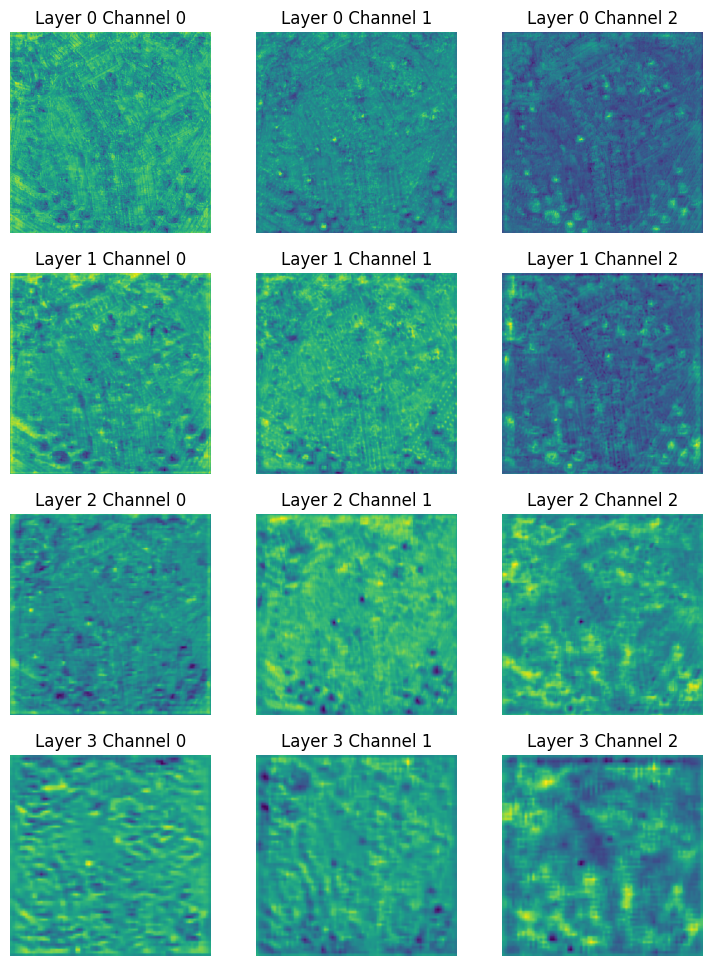

<Figure size 640x480 with 0 Axes>

In [36]:
layers = ['0', '1', '2', '3']  # these are the keys for the feature maps
channels = [0, 1, 2]

# Create the figure and axes
fig, axs = plt.subplots(len(layers), len(channels), figsize=(3*len(channels), 3*len(layers)))
plt.close(fig)  # Don't show the figure yet

for layer_index, l in enumerate(layers):
    for channel_index, c in enumerate(channels):
        feature_map = features[l][0][c].squeeze(0)

        # Normalize
        normalized_feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min())

        # Convert to numpy array
        normalized_feature_map_np = normalized_feature_map.detach().cpu().numpy()

        # Plot with origin at the top-left
        axs[layer_index, channel_index].imshow(normalized_feature_map_np, cmap='viridis', origin='upper')
        axs[layer_index, channel_index].axis('off')
        axs[layer_index, channel_index].set_title(f'Layer {l} Channel {c}')

# Display the figure after all feature maps are plotted
plt.tight_layout()
display(fig)

#### Low-level Features

The initial layers of backbone model show strong activations in regions corresponding to edges and corners in the image. These can be hard to intuit from the airport-level image we passed through the model, but the outlines of prominent structures and large-scale geometric features. Traditionally, early layers in a multi-layer CNN also capture things like texture and gradients within an image. These large scale patterns, coupled with the learned edge activations, are critical in learning high level structure from data.


#### Mid-Level Features

The middle layers of our backbone attempt to identify basic objects within our image. These objects are typically learned combinations of the edges and textures learned in lower layers. As an example, we might differentiate between a square of grass and a square of tarmac by their texture and edges. In layer `1` and `2` above, you might be able to see what looks like the structure of the airport's terminals and runway. If that image doesn't jump out at you, don't worry, the feature maps are much more useful for the regional-proposal network than they are to a viewer, and were trained for general object detection rather than aircraft detection on satellite images.

#### High-Level Features

The final layers of our backbone are typically useful for identifying higher-level, more abstract features such as an object in context (an airplane at a terminal as opposed to an airplane on the tarmac, or a private jet as opposed to a tanker). In our example, these features are less meaningful given the fact that the model was not trained using data from the same domain. In general, these feature maps are often hard to interpret visually, but are meaningful when developing the "objectness score" in the RPN.

#### The use of Feature Maps by the RPN

The RPN analyzes the feature maps, especially those from the deeper layers, to predict the likelihood of an object being present at different locations in the image. For each object candidate the RPN generates an anchor box and a class prediction objectness score. In the aircraft dataset, we have one main class of interest, namely aircraft, but in other common computer vision tasks, there can be tens to thousands of different classes for which we predict bounding boxes.

These candidate bounding boxes and objectness scores inform the final predictions for the model.